##Data Loading and Inspection

###Importing packages and libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(
    { "figure.figsize": (10,4) },
    color_codes=True
)
sns.set(font_scale=0.8)
%config InlineBackend.figure_formats = set(('retina', 'svg'))

We have imported the relevant python packages which will help us analyze and visualize the data

###Reading the data

In [ ]:
dataset_location = '/content/drive/MyDrive/Data Science/adverts.csv'
at_df = pd.read_csv(
    dataset_location
)

Here we have loaded the dataset and now it is ready for further analysis

###Sampling observations

To get a brief overview of the dataset we will work with, 3 samples have been displayed below. In this we can view all the properties and attributes of the cars listed.

####Viewing the data with sample() function

In [ ]:
at_df.sample(3, random_state=0)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
153310,202009304383905,0.0,NaN,Black,Fiat,500X,NEW,NaN,24925,SUV,False,Petrol
144641,202009304415745,12126.0,18,Black,Vauxhall,Corsa,USED,2018.0,8600,Hatchback,False,Petrol
367874,202009153760768,17488.0,19,Blue,Audi,A4,USED,2019.0,21799,Saloon,False,Diesel


####Viewing the data with head() function

In [ ]:
at_df.head(3)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol


####Viewing data using loc

In [ ]:
at_df.iloc[450:453]

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
450,202009103567913,35010.0,15,Red,Toyota,Prius,USED,2015.0,8690,Hatchback,False,Petrol Hybrid
451,202009103575246,39718.0,66,Black,Vauxhall,Insignia,USED,2016.0,9699,Estate,False,Diesel
452,202009113604948,36200.0,14,White,Volkswagen,Golf,USED,2014.0,14200,Hatchback,False,Diesel


##Data Understanding and Exploration

### Checking the size of original dataset

In [ ]:
at_df.shape

(402005, 12)

To understand the volume of the dataset that we are going to work on, we have displayed the shape of the dataset which shows we have 12 attributes of total 402005 cars.

###Finding out the data columns

In [ ]:
at_df.columns

Index(['public_reference', 'mileage', 'reg_code', 'standard_colour',
       'standard_make', 'standard_model', 'vehicle_condition',
       'year_of_registration', 'price', 'body_type', 'crossover_car_and_van',
       'fuel_type'],
      dtype='object')

Here we have listed all the attributes of the cars in the given dataset

###Finding min, max, median, mean of quantitative data


In [ ]:
at_df.describe()

,public_reference,mileage,year_of_registration,price
count,4.020050e+05,401878.000000,368694.000000,4.020050e+05
mean,2.020071e+14,37743.595656,2015.006206,1.734197e+04
std,1.691662e+10,34831.724018,7.962667,4.643746e+04
min,2.013072e+14,0.000000,999.000000,1.200000e+02
25%,2.020090e+14,10481.000000,2013.000000,7.495000e+03
50%,2.020093e+14,28629.500000,2016.000000,1.260000e+04
75%,2.020102e+14,56875.750000,2018.000000,2.000000e+04
max,2.020110e+14,999999.000000,2020.000000,9.999999e+06


To gain an overview of the quantitative nature of the dataset we have displayed the summary of the quantitative features. Here we can get a brief understanding of the average price, mileage of the cars listed. As the mean price and mileage is closer to its mininum value, that means there are fewer cars that are priced above 17342 compared the the cars that are priced below 17342 and fewer cars those who have milage above 37744 as compared to below 37744.

In [ ]:
at_df[["price", "mileage", "year_of_registration"]].agg({'price' : ['min', 'max',  'median'], 'mileage' : ['min', 'max', 'median'], 'year_of_registration': ['min', 'max', 'median']})

,price,mileage,year_of_registration
min,120.0,0.0,999.0
max,9999999.0,999999.0,2020.0
median,12600.0,28629.5,2016.0


Using this data we can get an idea of the range of the price, mileage and Year of registration. The latest year when the car was listed is 2020. Here minimum mileage is 0 which is probably of the brand new cars listed on the websites. 

In [ ]:
at_df[['price','standard_make']].sort_values(by='price', ascending=False).head(5)

,price,standard_make
147188,9999999,Maserati
141833,9999999,Ferrari
305436,9999999,Lamborghini
336536,9999999,Porsche
336202,9999999,Ferrari


Here are the top 5 most expensive cars along with their manufacturer names. 

###Lets see which standard make is listed the most

Text(0.5, 1.0, 'Distribution of Standard Make')

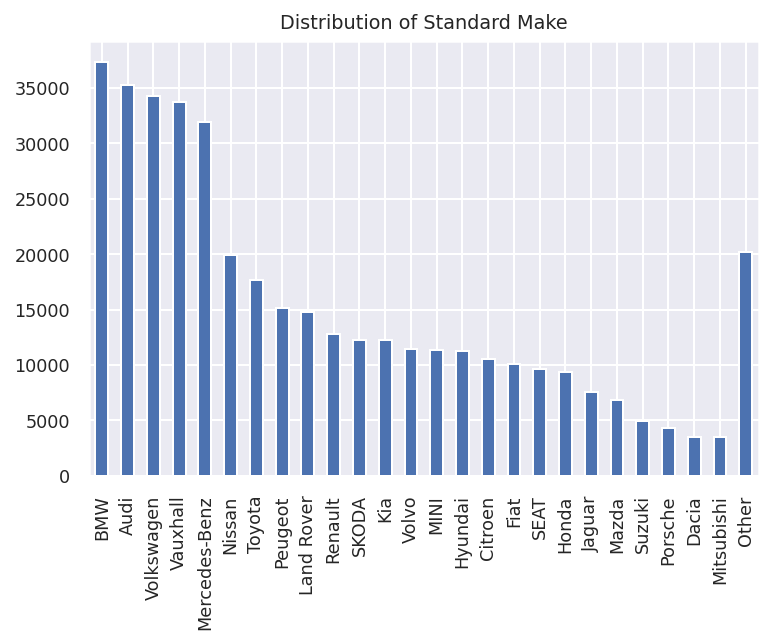

In [ ]:
tresh = 3000
a = at_df['standard_make'].value_counts()
b = a[a > tresh]
b['Other'] = a[a <= tresh].sum()
b.plot.bar()
plt.title('Distribution of Standard Make')

BMW individually has the most number of cars listed on the platform followed by Audi, Volkswagen,Vauxhall and Mercedes-Benz. There is a significant drop in the next car manufacturer with a difference of approximately 12500 units between Mercedes-Benz and Nissan. The number of units for all the other car makes gradually decreases. The top 5 brands namely BMW, Audi, Volkswagen,Vauxhall and Mercedes-Benz account for almost 43% of all the cars listed on the platform.

###Distribution of Body types

Text(0.5, 1.0, 'Distribution of Body Types')

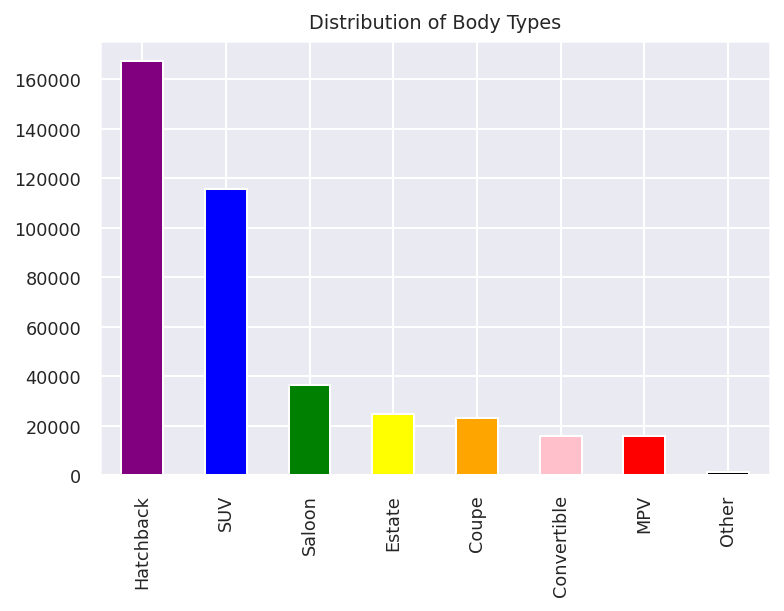

In [ ]:
tresh = 3000
colours = ['purple', 'blue', 'green', 'yellow', 'orange','pink', 'red', 'black' ]
c = at_df['body_type'].value_counts()
d = c[c > tresh]
d['Other'] = c[c <= tresh].sum()
d.plot.bar(color = colours)
plt.title("Distribution of Body Types")

Hatchbacks are the most listed followed by SUVs. These two body types contribute to approximately 71% of the total cars listed on the platform.

##Performing Data Cleaning operations

As the data consists of certain inconsistencies we are going to clean the data using various data cleansing mechanisms to get rid of invalid and irrelevant data.

###Replacing empty values with NaN

In [ ]:
at_df =(at_df.replace('', np.NaN))
at_df.head(3)

,public_reference,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
0,202006039777689,0.0,NaN,Grey,Volvo,XC90,NEW,NaN,73970,SUV,False,Petrol Plug-in Hybrid
1,202007020778260,108230.0,61,Blue,Jaguar,XF,USED,2011.0,7000,Saloon,False,Diesel
2,202007020778474,7800.0,17,Grey,SKODA,Yeti,USED,2017.0,14000,SUV,False,Petrol


### Ignoring missing/invalid data

In [ ]:
at_df = at_df.drop(['public_reference'], axis=1)

Assuming that all the Used cars must have all the properties like Public reference number, mileage, registration code, price and so on, hence dropping the entries containing used cars with missing properties.

In [ ]:
at_used_df = at_df.loc[ at_df['vehicle_condition']=='USED' ]
at_used_df = at_used_df.dropna(axis=0)
at_used_df.shape

(363424, 11)

In [ ]:
at_used_df.sample(3)

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
184705,16476.0,68,Grey,Citroen,Berlingo,USED,2019.0,14599,MPV,False,Petrol
314163,97000.0,07,Red,MINI,Hatch,USED,2007.0,1399,Hatchback,False,Petrol
38495,47000.0,60,White,Audi,R8,USED,2010.0,48850,Convertible,False,Petrol


Assuming that all new cars may not have the registration code, mileage,colour and year of registration, but it must have all the other properties to make a well informed decision by customer to buy a car. Hence dropping the entries with missing manufacturer details.

In [ ]:
at_new_df = at_df.loc[ at_df['vehicle_condition']=='NEW' ]
at_new_df = at_new_df.dropna(axis=0, subset=['standard_make','standard_model','price','body_type','crossover_car_and_van','fuel_type'])
at_new_df.shape

(31033, 11)

In [ ]:
at_new_df.sample(3)

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type
298292,15.0,NaN,White,Volkswagen,Polo,NEW,NaN,17320,Hatchback,False,Petrol
45969,10.0,NaN,Black,Audi,TTS,NEW,NaN,40982,Convertible,False,Petrol
371872,0.0,NaN,Black,Land Rover,Range Rover,NEW,NaN,77279,SUV,False,Diesel


###Replacing missing values

In [ ]:
at_new_df['year_of_registration'] = at_new_df['year_of_registration'].replace(np.nan, 0)
at_new_df['reg_code'] = at_new_df['year_of_registration'].replace(np.nan, "Unknown")
at_new_df['mileage'] = at_new_df['mileage'].replace(np.nan, 0)
at_new_df['standard_colour'] = at_new_df['standard_colour'].replace(np.nan, "Other")

### Now combining both datasets to form the original dataset with cleaned values.

In [ ]:
frames = [at_used_df, at_new_df]
AT_Clean_DF= pd.concat(frames)

In [ ]:
AT_Clean_DF.shape

(394457, 11)

Checking the size of the cleaned dataset.

In this way we have detected and dealt with 7,548 rows with incorrect/missing data

In [ ]:
bins = [-np.inf,999, 9999,99999,999999, np.inf]
labels=['Cheap','Economical', 'Moderate', 'Expensive','Overexpensive']
AT_Clean_DF['PriceCategory'] = pd.cut(AT_Clean_DF['price'], bins=bins, labels=labels)

Bifurcating the prices of the cars into 5 categories
1. Cheap
2. Economical
3. Moderate
4. Expensive
5. Overexpensive



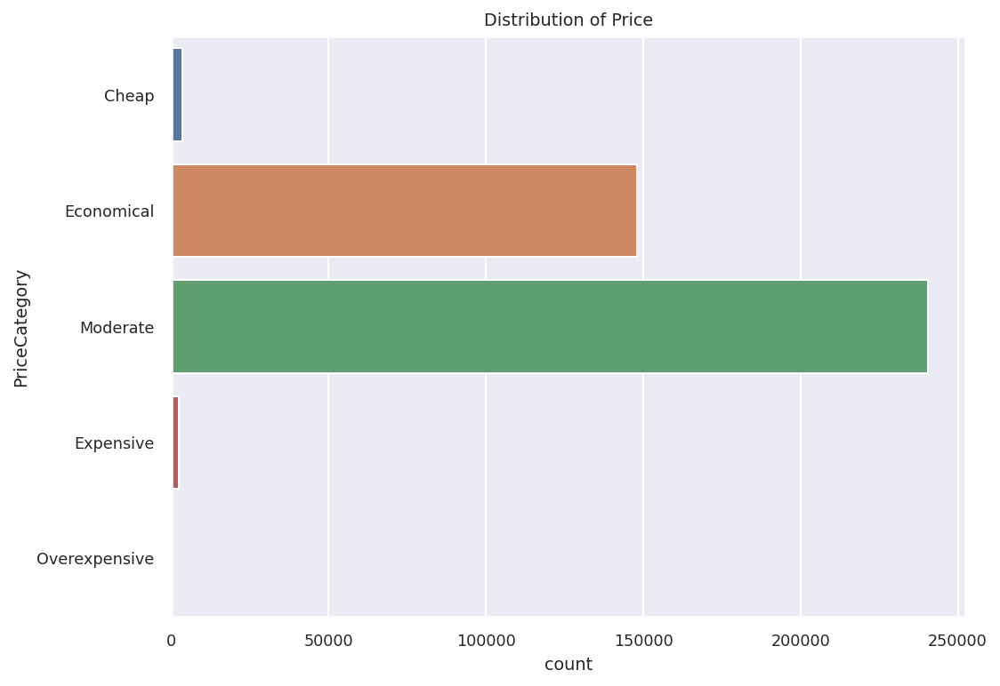

In [ ]:
f, ax = plt.subplots(figsize=(8, 6))
ax = sns.countplot(y="PriceCategory", data=AT_Clean_DF )
ax.set_title("Distribution of Price")
plt.show()

The above figure shows the distribution of prices of the cars. The cars in moderate and economical range shows the heigest number of entries. Almost 97% of the cars come into the moderate and economical price range.

##Data preparation and operations

###Cars grouped by fuel type showing the max price in the year of registration from 2010-2020

Let us check all the cars that are registered after 2014

In [ ]:
df = AT_Clean_DF.query('year_of_registration >= 2014')
df.sample(3)

,mileage,reg_code,standard_colour,standard_make,standard_model,vehicle_condition,year_of_registration,price,body_type,crossover_car_and_van,fuel_type,PriceCategory
136386,30000.0,16,White,Mazda,Mazda3,USED,2016.0,12000,Hatchback,False,Petrol,Moderate
372029,30386.0,19,Blue,Nissan,Qashqai,USED,2019.0,17950,SUV,False,Petrol,Moderate
335586,15607.0,18,White,Renault,Kadjar,USED,2018.0,13736,SUV,False,Petrol,Moderate


In [ ]:
df.groupby(['fuel_type', 'year_of_registration'])['price'].mean().unstack('year_of_registration')


year_of_registration,2014.0,2015.0,2016.0,2017.0,2018.0,2019.0,2020.0
fuel_type,,,,,,,
Bi Fuel,NaN,NaN,NaN,NaN,NaN,6999.000000,13960.021739
Diesel,11327.277852,13258.235408,15352.221547,17544.062740,22111.246189,27224.153976,34056.984429
Diesel Hybrid,14800.888889,17401.301205,20627.173333,19114.500000,17616.666667,36871.939394,40125.416667
Diesel Plug-in Hybrid,12440.000000,13145.000000,16001.200000,28537.967742,37438.000000,35634.828571,41536.607143
Electric,12470.008130,13181.199187,19989.625668,22266.031311,27366.378251,35041.288462,39360.222863
Petrol,11424.878604,13187.053613,14193.206155,14499.638070,17989.073263,22579.516805,28309.617602
Petrol Hybrid,11584.559546,14502.511006,14766.030753,16497.558970,17559.426213,24573.700111,26687.495637
Petrol Plug-in Hybrid,50393.397849,17791.969466,19726.573872,22922.438433,27746.455904,40501.873635,41124.421986


From the above table it can be concluded that irrespective of the type of fuel, the price of a car is directly propotional to the year of registration. As the year of registration increases, the price of the cars increase.

##Analysis of Relationships

###Bivariate Relationships


#### Price vs Year of registration

In [ ]:
AT_year_df = AT_Clean_DF.loc[ (AT_Clean_DF['body_type']=='Hatchback') & (AT_Clean_DF['mileage'].between(1000,10000)) ]

Text(0.5, 1.0, 'Year of registration Vs Price')

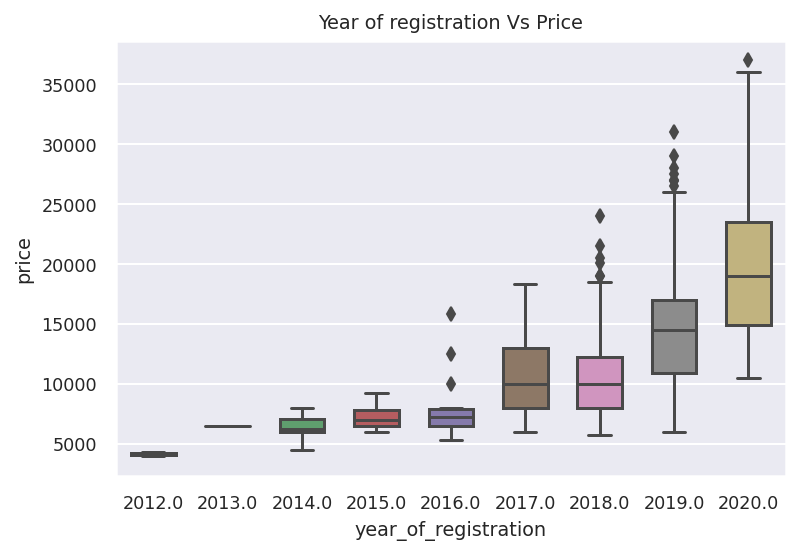

In [ ]:
f = sns.boxplot(x='year_of_registration', y='price', data=AT_year_df.loc[ AT_year_df['standard_make']=='SKODA' ], width=0.6);
f.set_title("Year of registration Vs Price")

From the above plot of price versus year of registration it can be visualised that there is a positive correlation between year of registration and price and the graph portrays an exponential growth.

#### Mileage vs Price

In [ ]:
AT_priceC_df = AT_Clean_DF.loc[ (AT_Clean_DF['body_type']=='Hatchback') & ((AT_Clean_DF['year_of_registration'] > 2015) | (AT_Clean_DF['year_of_registration'] == 0))]

Text(0.5, 1.0, 'Price Vs Mileage')

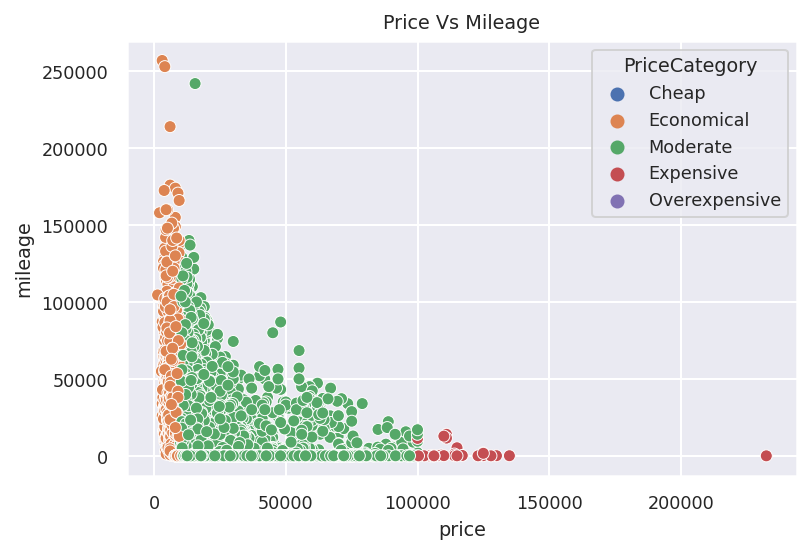

In [ ]:
f = sns.scatterplot(x='price', y='mileage', data=AT_priceC_df, hue='PriceCategory')
f.set_title("Price Vs Mileage")

The above scatterplot is similar to a rectangular hyperbola which indicates negative correlation. This means that as the mileage of a Hatchback increases, its price will eventually decrease. Hence we can see higher prices of cars which have lower mileages.


####Mileage vs Standard Make

In [ ]:
cars = ['Audi', 'BMW', 'Honda', 'Jaguar']
df = AT_Clean_DF.loc[AT_Clean_DF['standard_make'].isin(cars)]

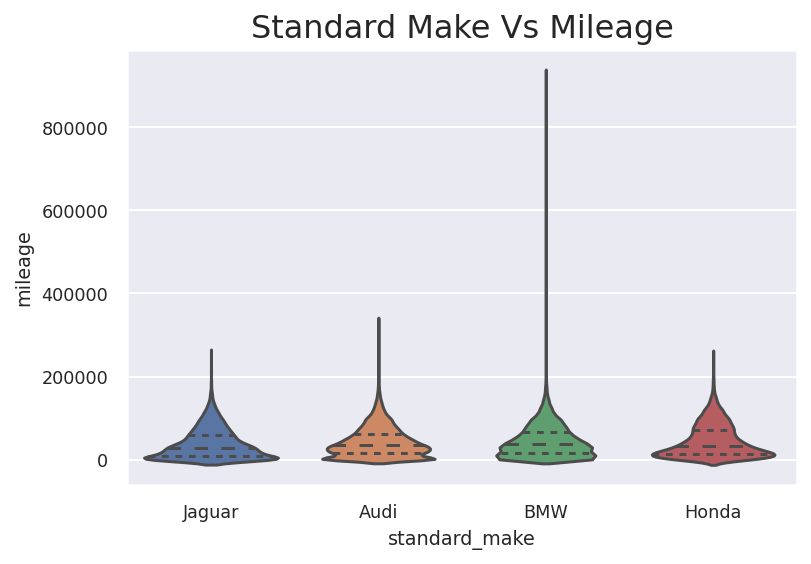

In [ ]:
ax = sns.violinplot(x="standard_make", y="mileage", inner='quartile', data=df)
ax.set_title('Standard Make Vs Mileage', fontsize=16);

From the above plot we can say that the medians of the mileage for above brands is approximately similar. BMW has elongated distribution of mileage perhaps as it is a brand which has a higher number of units listed on the platform. Honda has the least mileage distribution amongst the above manufacturers.

###Trivariate Relationships

####Price vs Year of Registration with Fuel type

In [ ]:
AT_fuel_df = AT_Clean_DF.loc[ (AT_Clean_DF['PriceCategory'] == 'Moderate') & (AT_Clean_DF['year_of_registration'] > 2015) ]

Text(0.5, 0.98, 'Year of Registration Vs Price with Fuel Type')

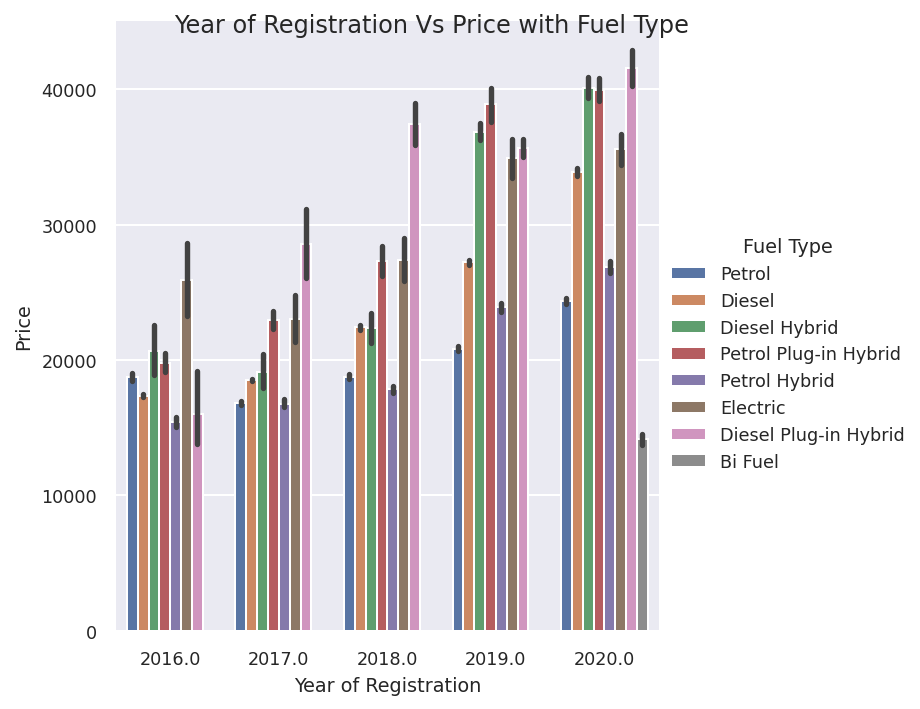

In [ ]:
g = sns.catplot(data=AT_fuel_df, kind="bar",y='price', x='year_of_registration', hue = 'fuel_type')
g.despine(left=True)
g.set_axis_labels("Year of Registration", "Price")
g.legend.set_title("Fuel Type")
g.fig.suptitle("Year of Registration Vs Price with Fuel Type")

We can see an increasing trend for Electric and Hybrid car prices. The prices of Hybrid cars - Diesel Hybrid, Petrol Plug-in Hybrid, Petrol Hybrid and Diesel Plug-in Hybrid - have raised with time whereas there is a very slight increase in the petrol and diesel car prices. Bi-fuel cars have immersed again in 2020.

#### Price vs Mileage with vehicle condition

In [ ]:
AT_VehicleCondition_df = AT_Clean_DF.loc[ (AT_Clean_DF['body_type']=='Convertible') & ((AT_Clean_DF['year_of_registration'] > 2015) | (AT_Clean_DF['year_of_registration'] == 0))]

Text(0.5, 1.0, 'Price vs Mileage with Vehicle Condition')

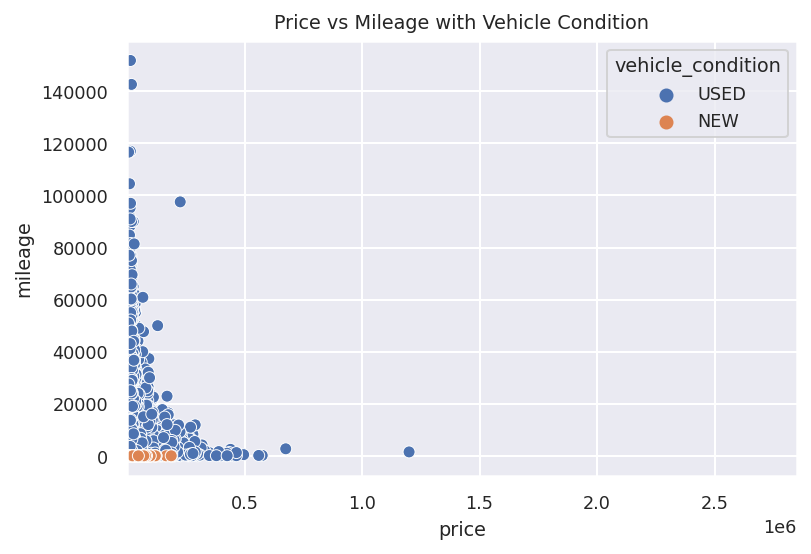

In [ ]:
ax = sns.scatterplot(x='price', y='mileage', data=AT_VehicleCondition_df, hue='vehicle_condition')
ax.set(xlim=(AT_Clean_DF['price'].min(), AT_Clean_DF['price'].max()))
ax.set_title("Price vs Mileage with Vehicle Condition")

From this plot it can be seen that the cars with low milage are new whereas the ones with higher mileage are used. The price of the car is indirectly dependent on the vehicle condition but is directly dependent on mileage.

##Conclusion

Finally to conclude all the above findings, we have plot the correlation matrix

Text(0.5, 1.0, 'Correlation Matrix')

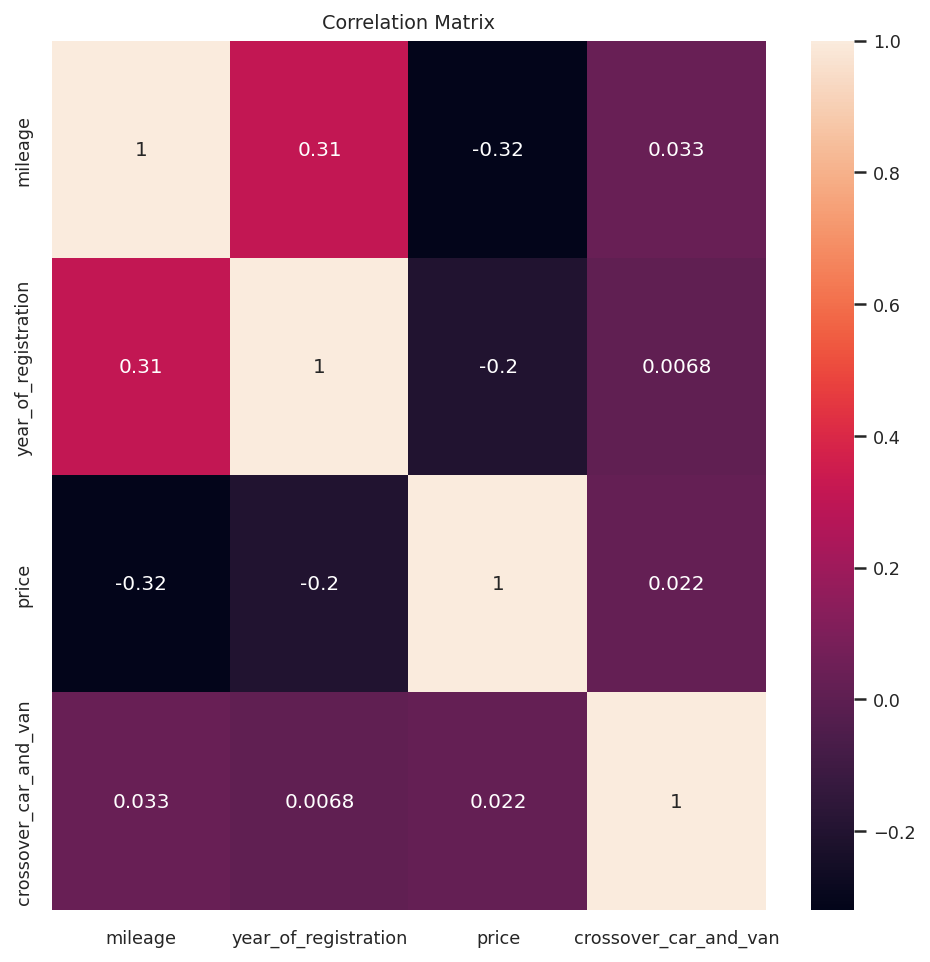

In [ ]:
corrmat = AT_Clean_DF.corr()
f, ax = plt.subplots(figsize=(8, 8))
g = sns.heatmap(corrmat,annot = True);
g.set_title("Correlation Matrix")

From the above heatplot following points can be deduced:
1. As price versus mileage has a negative correlation value price is indirectly propotional to the mileage. That is, as the mileage increases, the price of the car decreases.
2. The correlation value for year of registration and price is closer to zero and less that 0.2. It means these variables are weekly correlated
3. The correlation value for year of registration and mileage is greater than 0.4 and hence has are strongly corelated.

Therefore we can conclude that overall, mileage is one of the best predictors for the price of the car.